In [1]:
from pyspark.sql import SparkSession
from pyspark.sql.functions import col, to_date

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.patches import Rectangle
from datetime import datetime

In [2]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

pd.set_option('display.max_colwidth', None)
pd.set_option('display.max_rows', 100000)
pd.set_option('display.max_columns', 300)
pd.set_option('display.width', 10000)


In [3]:
# initiate spark session

spark = SparkSession \
    .builder \
    .appName("outputs for paper") \
    .getOrCreate()

sc = spark.sparkContext


In [4]:
# read in all news articles

articles = spark.read\
    .format("parquet")\
    .load("/Users/rais/Desktop/post grad/EBAC/2020/CA/canary_v1/bead_project/wtf/sandbox_data/dl_files/*")


In [5]:
articles.describe().show()


+-------+--------------------+-------------------+--------------------+--------------------+--------+--------------------+-----------------+--------------------+--------------------+
|summary|       date_download|       date_publish|         description|            filename|language|            maintext|    source_domain|               title|                 url|
+-------+--------------------+-------------------+--------------------+--------------------+--------+--------------------+-----------------+--------------------+--------------------+
|  count|                2506|               2506|                2502|                2506|    2506|                2419|             2506|                2506|                2506|
|   mean|                null|               null|                null|                null|    null|                null|             null|                null|                null|
| stddev|                null|               null|                null|              

In [6]:
articles.show()


+--------------------+--------------------+-------------------+--------------------+--------------------+--------+--------------------+-----------------+--------------------+--------------------+
|             authors|       date_download|       date_publish|         description|            filename|language|            maintext|    source_domain|               title|                 url|
+--------------------+--------------------+-------------------+--------------------+--------------------+--------+--------------------+-----------------+--------------------+--------------------+
|[Jonathan Poncian...|2021-03-03 21:18:...|2021-03-03 15:32:11|A short-lived sur...|https%3A%2F%2Fwww...|      en|Topline
Shares of...|   www.forbes.com|Billionaire Dan G...|https://www.forbe...|
|[Antony Leather, ...|2021-03-17 13:29:...|2021-03-17 07:59:57|AMD Radeon RX 670...|https%3A%2F%2Fwww...|      en|AMD's Radeon RX 6...|   www.forbes.com|AMD Radeon RX 670...|https://www.forbe...|
|[Jj Kinahan, Seni..

In [7]:
# drop duplicate articles
articles = articles.dropDuplicates(["authors", "date_publish", "title", "description", "source_domain"])
articles.count()

articles.groupBy(articles["source_domain"]).count().show()



2506

+-------------------+-----+
|      source_domain|count|
+-------------------+-----+
|www.marketwatch.com|   32|
|  cointelegraph.com|   21|
|     www.forbes.com|  516|
|   www.coindesk.com| 1009|
|        www.cnn.com|   49|
|  www.thestreet.com|  830|
|   seekingalpha.com|   49|
+-------------------+-----+



In [8]:
# convert to pandas dataframe to do plotting
articles_pd = articles\
    .withColumn("date_publish_date", to_date(col("date_publish")))\
    .select('source_domain','date_publish_date') \
    .toPandas()

In [9]:
articles_pd.count()
articles_pd.head()


source_domain        2506
date_publish_date    2506
dtype: int64

,source_domain,date_publish_date
0,www.thestreet.com,2021-04-16
1,www.thestreet.com,2021-04-01
2,www.thestreet.com,2021-04-16
3,www.thestreet.com,2021-04-09
4,www.coindesk.com,2021-04-13


In [10]:
articles_pd['date_publish_date'] = pd.to_datetime(articles_pd['date_publish_date'])
articles_pd.dtypes



source_domain                object
date_publish_date    datetime64[ns]
dtype: object

In [11]:
# count articles by source doamin and publish date
articles_pd = articles_pd.groupby(['source_domain', 'date_publish_date']).size().reset_index(name='counts')
articles_pd.head()


,source_domain,date_publish_date,counts
0,cointelegraph.com,2021-03-03,1
1,cointelegraph.com,2021-03-05,1
2,cointelegraph.com,2021-03-06,1
3,cointelegraph.com,2021-03-11,2
4,cointelegraph.com,2021-03-13,3


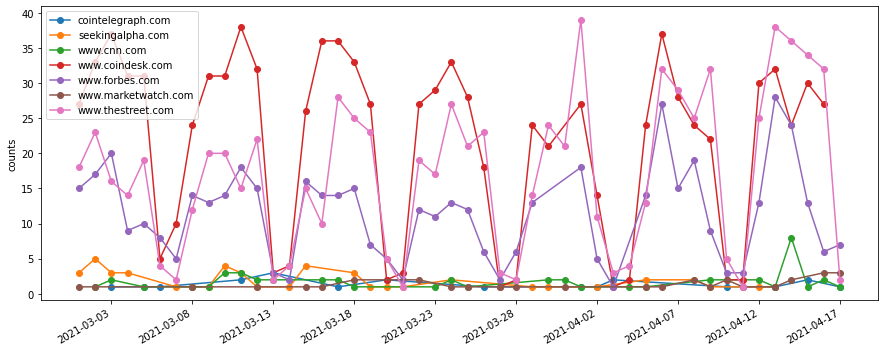

In [12]:
# Number of distinct Bitcoin-related articles published by each news website domains between 01 March and 16 April 2021

xtick_locator = mdates.DayLocator(interval=5)
fig, ax = plt.subplots(figsize = (15,6))
for key, grp in articles_pd.groupby(['source_domain']):
        ax = grp.plot(ax=ax, kind='line', x='date_publish_date', y='counts', label=key, marker='o')
ax.xaxis.set_major_locator(xtick_locator)
_ = plt.xlabel('')
_ = plt.ylabel('counts')

In [13]:
# read in bitfinex data
df = pd.read_csv('/Users/rais/Desktop/post grad/EBAC/2020/CA/canary_v1/bead_project/wtf/sandbox_data/bitfinex_btcusd.csv')
df.head()


,Unnamed: 0,time,open,close,high,low,volume,id_date
0,60,2021-02-15 00:00:00+08:00,48529.000000,48578.000000,48612.000000,48520.000000,12.926627,20210215
1,59,2021-02-15 00:01:00+08:00,48578.000000,48630.000000,48631.000000,48577.000000,4.387715,20210215
2,58,2021-02-15 00:02:00+08:00,48631.000000,48598.384466,48631.000000,48598.384466,4.431785,20210215
3,57,2021-02-15 00:03:00+08:00,48578.495841,48421.000000,48578.495841,48411.000000,5.557589,20210215
4,56,2021-02-15 00:04:00+08:00,48421.000000,48464.000000,48504.000000,48421.000000,9.576957,20210215


In [14]:
# convert to type datetime
df['time'] = pd.to_datetime(df['time'])

# put to index
df.index = df['time']

# convert to UTC+0
df.index = df.index.tz_convert(None)

# keep only close price
df = df[['close']]


In [15]:
df

,close
time,
2021-02-14 16:00:00,48578.000000
2021-02-14 16:01:00,48630.000000
2021-02-14 16:02:00,48598.384466
2021-02-14 16:03:00,48421.000000
2021-02-14 16:04:00,48464.000000
2021-02-14 16:05:00,48524.000000
2021-02-14 16:06:00,48579.000000
2021-02-14 16:07:00,48507.000000
2021-02-14 16:08:00,48554.000000


In [16]:
df2 = df.loc['20210330 12:00':'20210403 07:00']

In [17]:
df2.head()

,close
time,
2021-03-30 12:00:00,59408.0
2021-03-30 12:01:00,59458.0
2021-03-30 12:02:00,59386.0
2021-03-30 12:03:00,59358.0
2021-03-30 12:04:00,59402.0


In [18]:
# get hourly mean price for sample data
df2_hourly = df2.resample('H').mean()

In [19]:
df2_hourly

,close
time,
2021-03-30 12:00:00,59306.973411
2021-03-30 13:00:00,59123.057681
2021-03-30 14:00:00,58963.799333
2021-03-30 15:00:00,58825.225059
2021-03-30 16:00:00,58732.565952
2021-03-30 17:00:00,58833.415058
2021-03-30 18:00:00,58976.587447
2021-03-30 19:00:00,58912.232444
2021-03-30 20:00:00,58701.038013


In [20]:
df2_hourly['lag1'] = df2_hourly['close'].shift(1)

In [21]:
df2_hourly['delta'] =  df2_hourly['close'] - df2_hourly['lag1']

<AxesSubplot:>

([<matplotlib.axis.XTick at 0x114115100>], [Text(1, 0, '')])

Text(0, 0.5, 'change in hourly price (USD)')

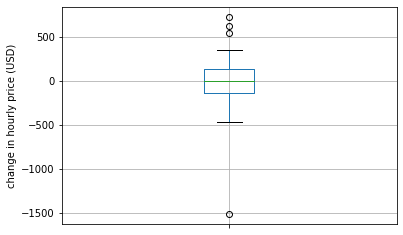

In [22]:
df2_hourly.boxplot('delta')
plt.xticks([1], [''])
plt.ylabel('change in hourly price (USD)')

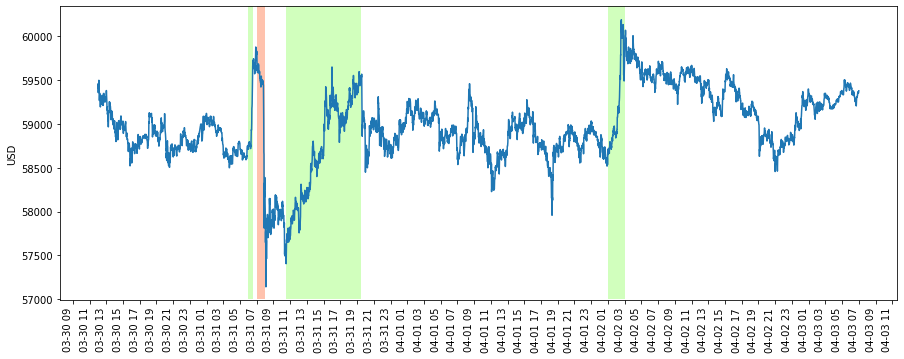

In [23]:
# Bitcoin price between 30 March  and 03 April 2021

xtick_locator = mdates.HourLocator(interval=2)

# event 1
start_date_1 = datetime(2021,3,31,6) # '2021-03-31 06:00:00'
end_date_1 = datetime(2021,3,31,6,30) # '2021-03-31 06:30:00'
start_1 = mdates.date2num(start_date_1)
end_1 = mdates.date2num(end_date_1)
width_1 = end_1 - start_1

# event 2
start_date_2 = datetime(2021,3,31,7) # '2021-03-31 07:00:00'
end_date_2 = datetime(2021,3,31,8) # '2021-03-31 08:00:00'
start_2 = mdates.date2num(start_date_2)
end_2 = mdates.date2num(end_date_2)
width_2 = end_2 - start_2

# event 3
start_date_3 = datetime(2021,3,31,10,30) # '2021-03-31 10:30:00'
end_date_3 = datetime(2021,3,31,19,30) # '2021-03-31 19:30:00'
start_3 = mdates.date2num(start_date_3)
end_3 = mdates.date2num(end_date_3)
width_3 = end_3 - start_3

# event 4
start_date_4 = datetime(2021,4,2,1) # '2021-04-02 01:00:00'
end_date_4 = datetime(2021,4,2,3) # '2021-04-02 03:00:00'
start_4 = mdates.date2num(start_date_4)
end_4 = mdates.date2num(end_date_4)
width_4 = end_4 - start_4


ax = df2.plot(figsize = (15,6))
ax.add_patch(Rectangle((start_1, 57000), width_1, 5000, facecolor='xkcd:very light green'))
ax.add_patch(Rectangle((start_2, 57000), width_2, 5000, facecolor=(1,.7,.6,.8)))
ax.add_patch(Rectangle((start_3, 57000), width_3, 5000, facecolor='xkcd:very light green'))
ax.add_patch(Rectangle((start_4, 57000), width_4, 5000, facecolor='xkcd:very light green'))
ax.xaxis.set_major_locator(xtick_locator)
ax.get_legend().remove()
_ = plt.xticks(rotation='vertical')
_ = plt.xlabel('')
_ = plt.ylabel('USD')


In [24]:
# Get data for longer time period
df3 = df[['close']]

Text(18720.291666666668, 47500, 'sample period')

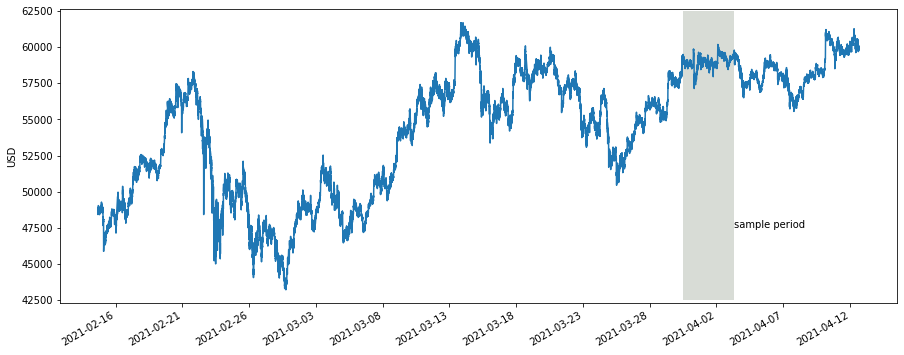

In [25]:
# Comparing the Bitcoin price volatility between the sample period and a longer time period (14 February to 12 April 2021)

xtick_locator = mdates.DayLocator(interval=5)
start_date = datetime(2021,3,30,12) # '2021-03-30 12:00:00'
end_date = datetime(2021,4,3,7) # '2021-04-03 07:00:00'
start = mdates.date2num(start_date)
end = mdates.date2num(end_date)
width = end - start


ax = df3.plot(figsize = (15,6))
ax.add_patch(Rectangle((start, 42500), width, 20000, facecolor='xkcd:light grey'))
ax.text(end, 47500, 'sample period')
ax.xaxis.set_major_locator(xtick_locator)
ax.get_legend().remove()
_ = plt.xlabel('')
_ = plt.ylabel('USD')